# Project deliverable : 1st Improvement
## Choudhary Usman Alam 
## Saadi Humayun
## Instructor : Sir Murtaza Taj
## TA : Aamil Khan

# Importing Necessary Libraries

In [1]:
import os
import shutil
import json
import random

import torch
import torchvision
from torchvision import transforms
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Rectangle
import numpy as np
from tqdm.notebook import tqdm

# Importing MegaDetector Detection Model 

In [2]:
from PytorchWildlife.models import detection as pw_detection
detection_model = pw_detection.MegaDetectorV6(version='MDV6-yolov9-c', device='cuda')

Ultralytics 8.3.113 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


# Flattening Image Directories

In [7]:
src_root = '/kaggle/input/missouri-deer-species'
dst_root = '/kaggle/working/flattened_dataset'

for class_name in os.listdir(src_root):
    class_path = os.path.join(src_root, class_name)
    
    if not os.path.isdir(class_path):
        continue
    print(f"Processing class: {class_name}")

    flattened_class_dir = os.path.join(dst_root, class_name)
    os.makedirs(flattened_class_dir, exist_ok=True)
    for subfolder in os.listdir(class_path):
        subfolder_path = os.path.join(class_path, subfolder)
        
        if not os.path.isdir(subfolder_path):
            continue

        for filename in os.listdir(subfolder_path):
            src_img = os.path.join(subfolder_path, filename)
            dst_img = os.path.join(flattened_class_dir, f"{subfolder}_{filename}")
            shutil.copy2(src_img, dst_img)

print(" Flattening complete.")

Processing class: 1.57-Red_Deer
Processing class: 1.58-Roe_Deer
Processing class: 1.07-Red_Brocket_Deer
Processing class: 1.27-White_Tailed_Deer
 Flattening complete.


# Visualizing the dataset

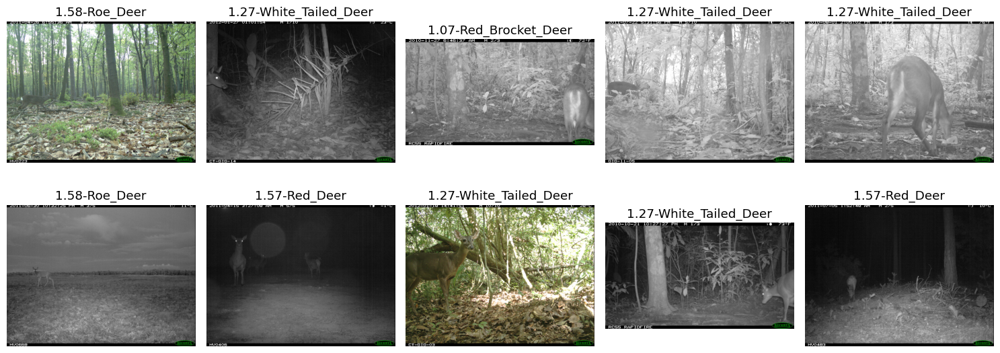

In [10]:
flattened_root = '/kaggle/working/flattened_dataset'
all_images = []
for class_name in os.listdir(flattened_root):
    class_dir = os.path.join(flattened_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    for img_file in os.listdir(class_dir):
        all_images.append((os.path.join(class_dir, img_file), class_name))

random_images = random.sample(all_images, 10)
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for ax, (img_path, label) in zip(axes.flatten(), random_images):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title(label)
    ax.axis('off')

plt.tight_layout()
display(fig)

# Detection of Animals using MegaDetector 

In [ ]:
flattened_root = "/kaggle/working/flattened_dataset"
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-c")
detection_data = {}

for root, dirs, files in os.walk(flattened_root):
    for file in tqdm(files, desc=f"Processing images in {root}"):
        if not file.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        img_path = os.path.join(root, file)
        relative_path = os.path.relpath(img_path, flattened_root)
        try:
            img_pil = Image.open(img_path).convert("RGB")
            img_np = np.array(img_pil)
            result = detection_model.single_image_detection(img_np)
            detections = result["detections"]
            detection_data[relative_path] = []

            for i in range(len(detections.xyxy)):
                bbox = detections.xyxy[i].tolist()
                conf = float(detections.confidence[i])
                class_id = int(detections.class_id[i])
                
                detection_data[relative_path].append({
                    "bbox": bbox,
                    "confidence": conf,
                    "class": "animal"
                })

        except Exception as e:
            print(f"Error processing {img_path}: {e}")

with open("flattened_detections.json", "w") as f:
    json.dump(detection_data, f, indent=2)

print("Detection results saved to flattened_detections.json")

Ultralytics 8.3.111 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


Processing images in /kaggle/working/flattened_dataset: 0it [00:00, ?it/s]
Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 0/1271 [00:00<?, ?it/s]


0: 640x640 1 animal, 47.5ms
Speed: 4.4ms preprocess, 47.5ms inference, 242.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 1/1271 [00:00<10:39,  1.99it/s]


0: 640x640 1 animal, 45.9ms
Speed: 2.9ms preprocess, 45.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 45.9ms
Speed: 2.7ms preprocess, 45.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 3/1271 [00:00<04:04,  5.18it/s]


0: 640x640 1 animal, 42.8ms
Speed: 2.9ms preprocess, 42.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 31.6ms
Speed: 2.8ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   0%|          | 5/1271 [00:00<02:45,  7.65it/s]


0: 640x640 1 animal, 31.6ms
Speed: 2.7ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 31.6ms
Speed: 2.8ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 7/1271 [00:00<02:09,  9.75it/s]


0: 640x640 1 animal, 31.6ms
Speed: 2.8ms preprocess, 31.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 27.7ms
Speed: 2.7ms preprocess, 27.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 9/1271 [00:01<01:50, 11.43it/s]


0: 640x640 (no detections), 27.7ms
Speed: 2.7ms preprocess, 27.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 26.3ms
Speed: 2.6ms preprocess, 26.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 11/1271 [00:01<01:38, 12.79it/s]


0: 640x640 1 animal, 26.3ms
Speed: 2.7ms preprocess, 26.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.6ms
Speed: 2.9ms preprocess, 25.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 13/1271 [00:01<01:29, 14.11it/s]


0: 640x640 1 animal, 24.9ms
Speed: 2.6ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 3 animals, 24.2ms
Speed: 2.6ms preprocess, 24.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|          | 15/1271 [00:01<01:25, 14.68it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.8ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|▏         | 17/1271 [00:01<01:23, 15.08it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.8ms preprocess, 24.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   1%|▏         | 19/1271 [00:01<01:21, 15.31it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 21/1271 [00:01<01:21, 15.29it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.7ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 23/1271 [00:01<01:21, 15.40it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 25/1271 [00:02<01:20, 15.49it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.6ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 27/1271 [00:02<01:20, 15.53it/s]


0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 29/1271 [00:02<01:21, 15.28it/s]


0: 640x640 (no detections), 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   2%|▏         | 31/1271 [00:02<01:20, 15.43it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 33/1271 [00:02<01:19, 15.59it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 35/1271 [00:02<01:19, 15.51it/s]


0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 37/1271 [00:02<01:20, 15.24it/s]


0: 640x640 2 animals, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 39/1271 [00:02<01:21, 15.13it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.1ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.7ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 41/1271 [00:03<01:20, 15.28it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   3%|▎         | 43/1271 [00:03<01:20, 15.21it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.8ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▎         | 45/1271 [00:03<01:20, 15.17it/s]


0: 640x640 1 animal, 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▎         | 47/1271 [00:03<01:21, 15.03it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 49/1271 [00:03<01:20, 15.21it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 51/1271 [00:03<01:20, 15.23it/s]


0: 640x640 2 animals, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.0ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 53/1271 [00:03<01:19, 15.32it/s]


0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.9ms
Speed: 2.9ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 55/1271 [00:04<01:18, 15.44it/s]


0: 640x640 1 animal, 24.9ms
Speed: 3.0ms preprocess, 24.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.8ms
Speed: 2.7ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   4%|▍         | 57/1271 [00:04<01:18, 15.45it/s]


0: 640x640 (no detections), 25.1ms
Speed: 3.0ms preprocess, 25.1ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 2.9ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▍         | 59/1271 [00:04<01:17, 15.67it/s]


0: 640x640 1 animal, 24.8ms
Speed: 3.0ms preprocess, 24.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.0ms
Speed: 3.3ms preprocess, 25.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▍         | 61/1271 [00:04<01:16, 15.91it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.8ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 25.1ms
Speed: 3.3ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▍         | 63/1271 [00:04<01:15, 15.94it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 animals, 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▌         | 65/1271 [00:04<01:16, 15.77it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.6ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▌         | 67/1271 [00:04<01:15, 15.92it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   5%|▌         | 69/1271 [00:04<01:15, 16.02it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 71/1271 [00:05<01:15, 15.91it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.8ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.6ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 73/1271 [00:05<01:15, 15.96it/s]


0: 640x640 2 animals, 24.1ms
Speed: 3.0ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.7ms preprocess, 24.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 75/1271 [00:05<01:15, 15.89it/s]


0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.2ms
Speed: 2.9ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 77/1271 [00:05<01:13, 16.25it/s]


0: 640x640 1 animal, 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▌         | 79/1271 [00:05<01:13, 16.21it/s]


0: 640x640 (no detections), 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   6%|▋         | 81/1271 [00:05<01:12, 16.31it/s]


0: 640x640 (no detections), 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 83/1271 [00:05<01:12, 16.42it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.7ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 85/1271 [00:05<01:12, 16.36it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 2.6ms preprocess, 24.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 87/1271 [00:06<01:13, 16.16it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.6ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.9ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 89/1271 [00:06<01:12, 16.33it/s]


0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.3ms
Speed: 2.8ms preprocess, 23.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 91/1271 [00:06<01:11, 16.45it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 93/1271 [00:06<01:13, 16.03it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   7%|▋         | 95/1271 [00:06<01:11, 16.36it/s]


0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 97/1271 [00:06<01:10, 16.57it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 99/1271 [00:06<01:12, 16.27it/s]


0: 640x640 (no detections), 23.4ms
Speed: 2.6ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 25.4ms
Speed: 2.8ms preprocess, 25.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 101/1271 [00:06<01:09, 16.72it/s]


0: 640x640 1 animal, 25.1ms
Speed: 2.7ms preprocess, 25.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.6ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 103/1271 [00:06<01:10, 16.63it/s]


0: 640x640 (no detections), 24.7ms
Speed: 2.9ms preprocess, 24.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.0ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 105/1271 [00:07<01:11, 16.31it/s]


0: 640x640 1 animal, 24.6ms
Speed: 2.6ms preprocess, 24.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 2.7ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   8%|▊         | 107/1271 [00:07<01:10, 16.40it/s]


0: 640x640 (no detections), 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.9ms
Speed: 2.7ms preprocess, 24.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▊         | 109/1271 [00:07<01:11, 16.29it/s]


0: 640x640 (no detections), 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 3.2ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▊         | 111/1271 [00:07<01:11, 16.23it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.8ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.4ms
Speed: 3.6ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 113/1271 [00:07<01:11, 16.23it/s]


0: 640x640 2 animals, 23.2ms
Speed: 2.9ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 115/1271 [00:07<01:11, 16.24it/s]


0: 640x640 1 animal, 23.4ms
Speed: 3.0ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 117/1271 [00:07<01:09, 16.54it/s]


0: 640x640 1 animal, 23.2ms
Speed: 2.9ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 3.1ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:   9%|▉         | 119/1271 [00:07<01:08, 16.84it/s]


0: 640x640 2 animals, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 121/1271 [00:08<01:09, 16.66it/s]


0: 640x640 2 animals, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 123/1271 [00:08<01:10, 16.30it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.7ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 125/1271 [00:08<01:09, 16.41it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.2ms
Speed: 2.6ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|▉         | 127/1271 [00:08<01:09, 16.51it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|█         | 129/1271 [00:08<01:09, 16.49it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 3.1ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|█         | 131/1271 [00:08<01:09, 16.40it/s]


0: 640x640 1 animal, 23.3ms
Speed: 2.8ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.1ms
Speed: 2.6ms preprocess, 23.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  10%|█         | 133/1271 [00:08<01:10, 16.15it/s]


0: 640x640 1 animal, 23.6ms
Speed: 2.9ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 135/1271 [00:08<01:09, 16.31it/s]


0: 640x640 (no detections), 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 137/1271 [00:09<01:08, 16.65it/s]


0: 640x640 1 animal, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.4ms
Speed: 2.7ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 139/1271 [00:09<01:07, 16.72it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.9ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█         | 141/1271 [00:09<01:09, 16.25it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.5ms
Speed: 3.2ms preprocess, 23.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█▏        | 143/1271 [00:09<01:09, 16.34it/s]


0: 640x640 1 animal, 23.1ms
Speed: 3.1ms preprocess, 23.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.4ms
Speed: 3.3ms preprocess, 23.4ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  11%|█▏        | 145/1271 [00:09<01:08, 16.36it/s]


0: 640x640 1 animal, 23.1ms
Speed: 2.8ms preprocess, 23.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.3ms
Speed: 3.1ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 147/1271 [00:09<01:10, 15.98it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 149/1271 [00:09<01:09, 16.14it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.8ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 151/1271 [00:09<01:08, 16.45it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.8ms preprocess, 24.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 153/1271 [00:10<01:11, 15.60it/s]


0: 640x640 1 animal, 24.5ms
Speed: 3.0ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 155/1271 [00:10<01:09, 16.09it/s]


0: 640x640 1 animal, 24.2ms
Speed: 3.0ms preprocess, 24.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.3ms
Speed: 2.7ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  12%|█▏        | 157/1271 [00:10<01:08, 16.21it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 159/1271 [00:10<01:09, 15.93it/s]


0: 640x640 1 animal, 23.9ms
Speed: 2.6ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 161/1271 [00:10<01:09, 16.06it/s]


0: 640x640 (no detections), 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 163/1271 [00:10<01:09, 16.00it/s]


0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 165/1271 [00:10<01:09, 15.93it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 167/1271 [00:10<01:06, 16.52it/s]


0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 169/1271 [00:11<01:06, 16.53it/s]


0: 640x640 (no detections), 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  13%|█▎        | 171/1271 [00:11<01:06, 16.49it/s]


0: 640x640 (no detections), 24.2ms
Speed: 2.8ms preprocess, 24.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▎        | 173/1271 [00:11<01:06, 16.59it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.7ms
Speed: 2.6ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 175/1271 [00:11<01:07, 16.32it/s]


0: 640x640 2 animals, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 177/1271 [00:11<01:07, 16.16it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.7ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 179/1271 [00:11<01:06, 16.43it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.7ms
Speed: 2.6ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 181/1271 [00:11<01:05, 16.57it/s]


0: 640x640 (no detections), 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.1ms
Speed: 2.9ms preprocess, 24.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  14%|█▍        | 183/1271 [00:11<01:06, 16.38it/s]


0: 640x640 1 animal, 24.4ms
Speed: 3.0ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▍        | 185/1271 [00:12<01:06, 16.40it/s]


0: 640x640 1 animal, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.6ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▍        | 187/1271 [00:12<01:05, 16.62it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.9ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.0ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▍        | 189/1271 [00:12<01:04, 16.66it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.7ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 3.2ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 191/1271 [00:12<01:05, 16.52it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.7ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.6ms preprocess, 24.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 193/1271 [00:12<01:04, 16.67it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.8ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 195/1271 [00:12<01:05, 16.49it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  15%|█▌        | 197/1271 [00:12<01:05, 16.51it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.9ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 199/1271 [00:12<01:04, 16.62it/s]


0: 640x640 (no detections), 23.3ms
Speed: 3.1ms preprocess, 23.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 201/1271 [00:12<01:06, 16.10it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 3.1ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 203/1271 [00:13<01:05, 16.26it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.6ms preprocess, 23.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▌        | 205/1271 [00:13<01:04, 16.55it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.9ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▋        | 207/1271 [00:13<01:05, 16.18it/s]


0: 640x640 1 animal, 23.7ms
Speed: 2.6ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  16%|█▋        | 209/1271 [00:13<01:05, 16.16it/s]


0: 640x640 1 animal, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 211/1271 [00:13<01:04, 16.47it/s]


0: 640x640 2 animals, 23.6ms
Speed: 3.2ms preprocess, 23.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 213/1271 [00:13<01:04, 16.44it/s]


0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.8ms
Speed: 3.1ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 215/1271 [00:13<01:03, 16.52it/s]


0: 640x640 1 animal, 23.9ms
Speed: 3.0ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.6ms
Speed: 2.8ms preprocess, 24.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 217/1271 [00:13<01:02, 16.83it/s]


0: 640x640 1 animal, 23.6ms
Speed: 3.0ms preprocess, 23.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.5ms
Speed: 2.9ms preprocess, 23.5ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 219/1271 [00:14<01:02, 16.76it/s]


0: 640x640 1 animal, 23.4ms
Speed: 2.9ms preprocess, 23.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  17%|█▋        | 221/1271 [00:14<01:02, 16.75it/s]


0: 640x640 (no detections), 23.5ms
Speed: 2.9ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.3ms
Speed: 2.9ms preprocess, 23.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 223/1271 [00:14<01:01, 17.05it/s]


0: 640x640 1 animal, 23.7ms
Speed: 3.1ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 225/1271 [00:14<01:03, 16.40it/s]


0: 640x640 1 animal, 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.2ms
Speed: 3.0ms preprocess, 23.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 227/1271 [00:14<01:04, 16.09it/s]


0: 640x640 (no detections), 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.6ms
Speed: 2.6ms preprocess, 23.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 229/1271 [00:14<01:04, 16.04it/s]


0: 640x640 (no detections), 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.7ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 231/1271 [00:14<01:03, 16.26it/s]


0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 233/1271 [00:14<01:03, 16.36it/s]


0: 640x640 1 animal, 24.7ms
Speed: 2.8ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.7ms
Speed: 3.3ms preprocess, 24.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  18%|█▊        | 235/1271 [00:15<01:02, 16.54it/s]


0: 640x640 (no detections), 24.6ms
Speed: 3.4ms preprocess, 24.6ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▊        | 237/1271 [00:15<01:03, 16.31it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.9ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.8ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 239/1271 [00:15<01:02, 16.49it/s]


0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.5ms
Speed: 2.6ms preprocess, 24.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 241/1271 [00:15<01:01, 16.70it/s]


0: 640x640 (no detections), 23.7ms
Speed: 2.9ms preprocess, 23.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 animals, 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 243/1271 [00:15<01:02, 16.43it/s]


0: 640x640 (no detections), 24.2ms
Speed: 2.6ms preprocess, 24.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 245/1271 [00:15<01:00, 16.87it/s]


0: 640x640 1 animal, 23.9ms
Speed: 2.8ms preprocess, 23.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  19%|█▉        | 247/1271 [00:15<01:00, 16.94it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.0ms
Speed: 2.8ms preprocess, 24.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|█▉        | 249/1271 [00:15<01:00, 16.84it/s]


0: 640x640 1 animal, 24.3ms
Speed: 2.7ms preprocess, 24.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 23.7ms
Speed: 2.8ms preprocess, 23.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|█▉        | 251/1271 [00:15<01:00, 16.87it/s]


0: 640x640 1 animal, 23.8ms
Speed: 2.8ms preprocess, 23.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 24.5ms
Speed: 2.8ms preprocess, 24.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|█▉        | 253/1271 [00:16<01:00, 16.93it/s]


0: 640x640 1 animal, 24.3ms
Speed: 3.0ms preprocess, 24.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 animal, 24.4ms
Speed: 2.7ms preprocess, 24.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


Processing images in /kaggle/working/flattened_dataset/1.58-Roe_Deer:  20%|██        | 255/1271 [00:16<01:02, 16.36it/s]


0: 640x640 1 animal, 24.4ms


# Visualization of the Bounding-box around animals 

Ultralytics 8.3.111 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs

0: 640x640 2 animals, 48.8ms
Speed: 3.1ms preprocess, 48.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


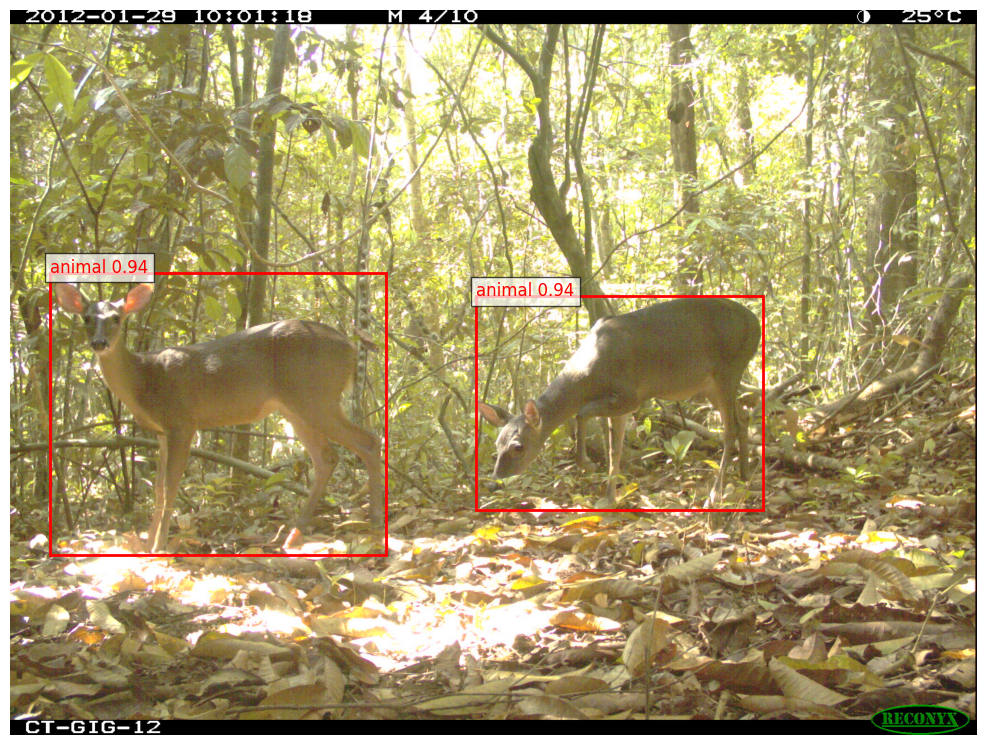


0: 640x640 1 animal, 48.8ms
Speed: 2.9ms preprocess, 48.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


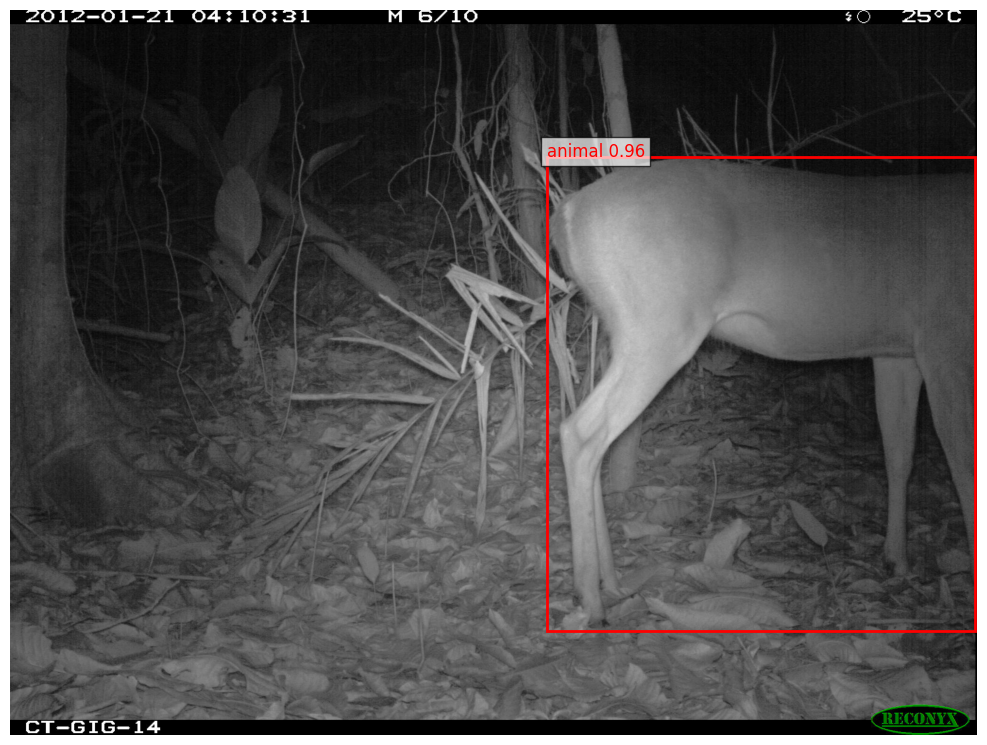


0: 640x640 (no detections), 48.9ms
Speed: 3.2ms preprocess, 48.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


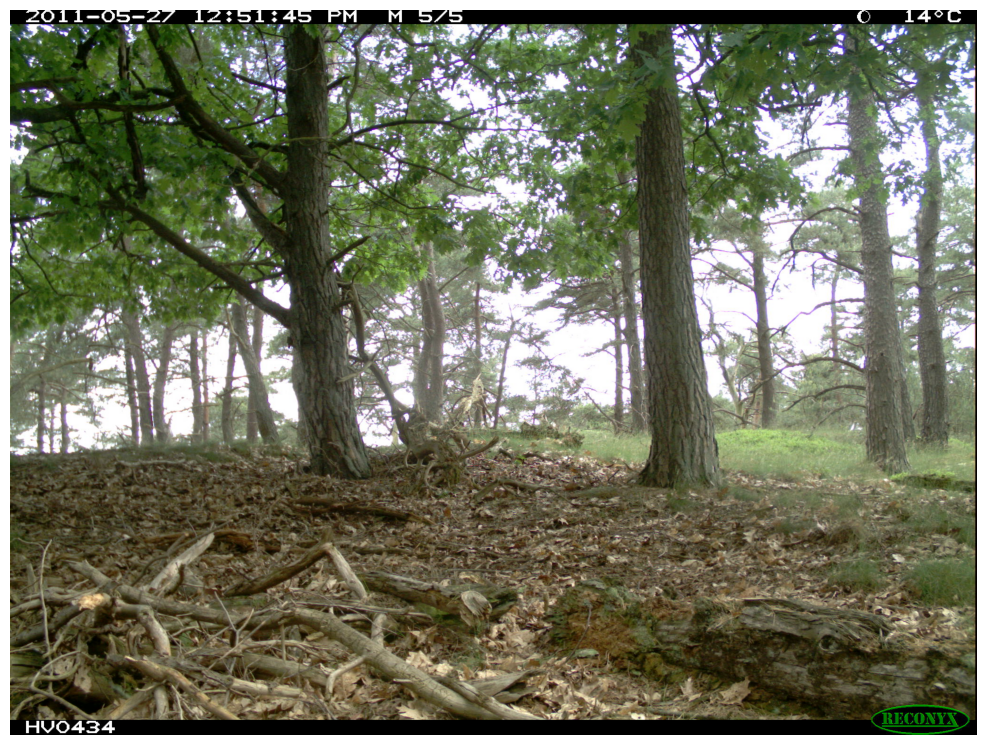


0: 640x640 1 animal, 48.9ms
Speed: 3.4ms preprocess, 48.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


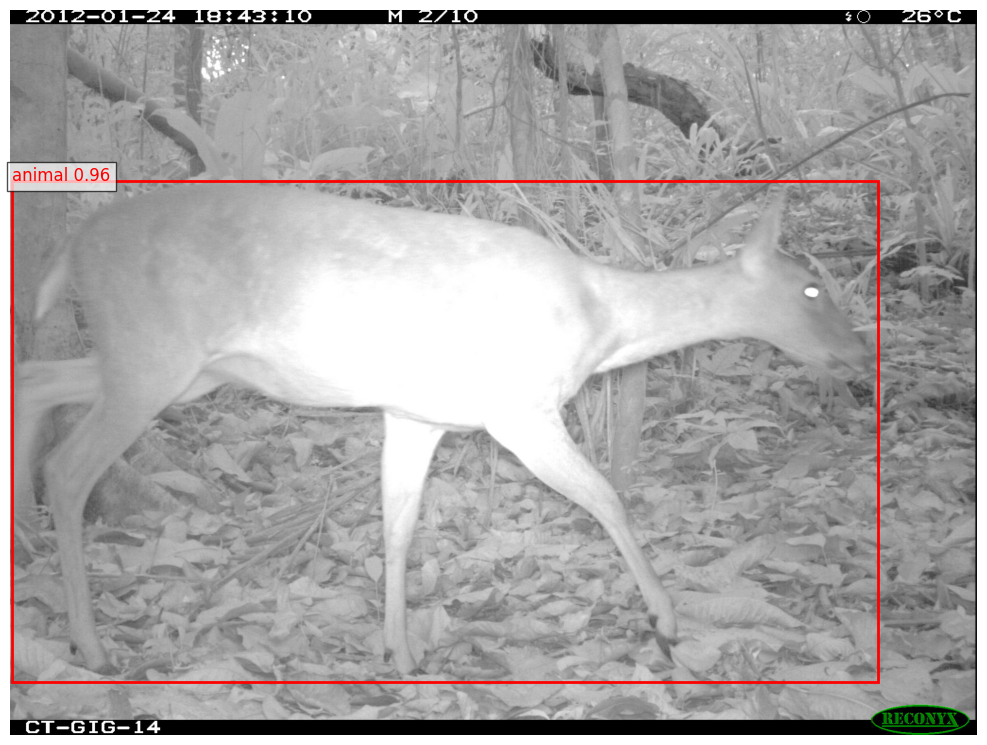


0: 640x640 1 animal, 48.9ms
Speed: 3.2ms preprocess, 48.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


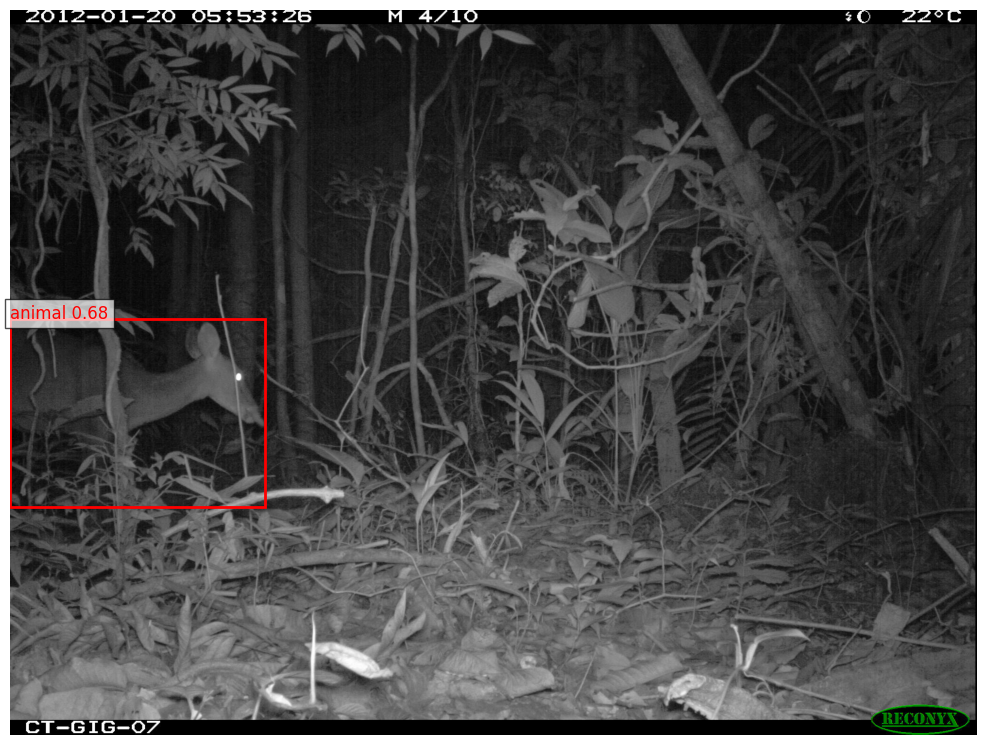


0: 640x640 3 animals, 48.8ms
Speed: 3.0ms preprocess, 48.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


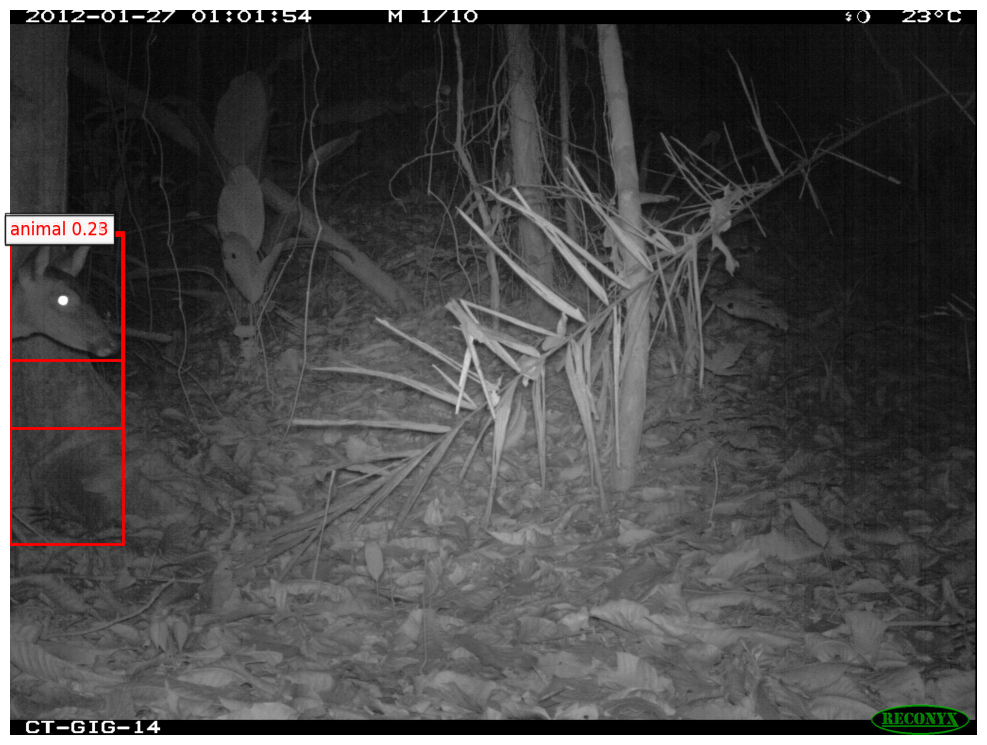


0: 640x640 (no detections), 48.8ms
Speed: 3.3ms preprocess, 48.8ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


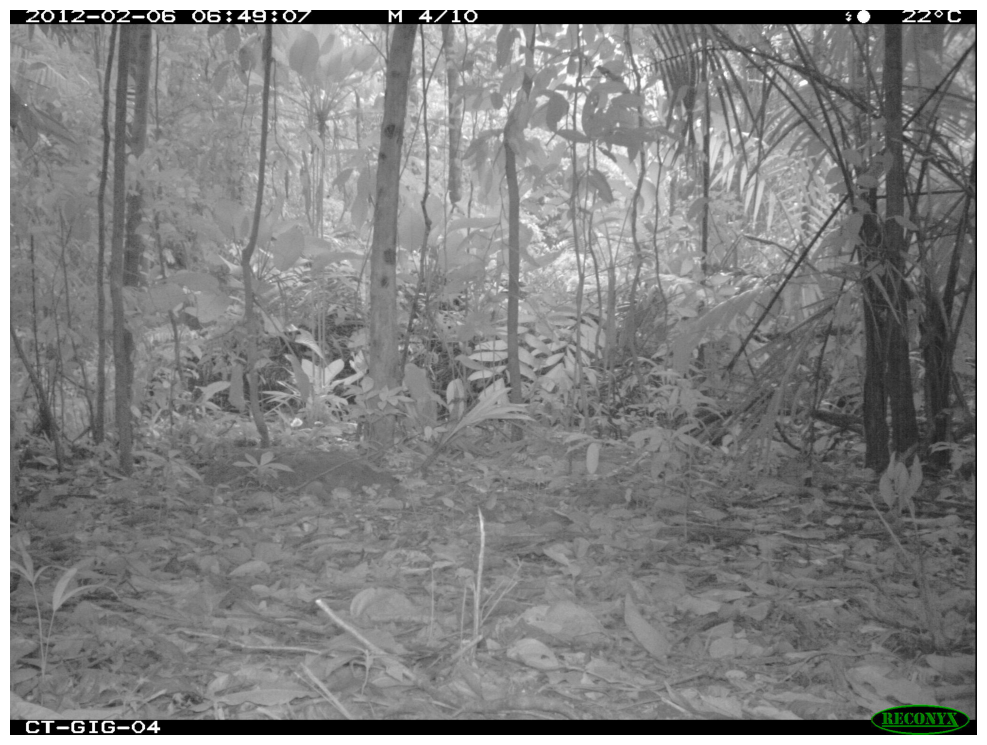


0: 640x640 6 animals, 48.8ms
Speed: 3.0ms preprocess, 48.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-c")
dataset_root = "/kaggle/input/missouri-deer-species"
all_image_paths = []

for class_folder in os.listdir(dataset_root):
    class_path = os.path.join(dataset_root, class_folder)
    if not os.path.isdir(class_path):
        continue
    for seq_folder in os.listdir(class_path):
        seq_path = os.path.join(class_path, seq_folder)
        if not os.path.isdir(seq_path):
            continue
        for filename in os.listdir(seq_path):
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                all_image_paths.append(os.path.join(seq_path, filename))
random.shuffle(all_image_paths)
sampled_paths = all_image_paths[:10]

for idx, image_path in enumerate(sampled_paths):
    try:
        img_pil = Image.open(image_path).convert("RGB")
        img_np = np.array(img_pil)
        detection_result = detection_model.single_image_detection(img_np)
        fig, ax = plt.subplots(1, figsize=(10, 10))
        ax.imshow(img_pil)
        detections = detection_result["detections"]
        boxes = detections.xyxy
        confidences = detections.confidence

        for i in range(len(boxes)):
            bbox = boxes[i]
            confidence = confidences[i]
            label = f"animal {confidence:.2f}"
            rect = Rectangle(
                (bbox[0], bbox[1]),
                bbox[2] - bbox[0],
                bbox[3] - bbox[1],
                linewidth=2,
                edgecolor='red',
                facecolor='none'
            )
            ax.add_patch(rect)

            ax.text(
                bbox[0], bbox[1],
                label,
                color='red',
                fontsize=12,
                bbox=dict(facecolor='white', alpha=0.7)
            )

        plt.axis('off')
        plt.tight_layout()
        display(fig)
        plt.close()

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Cropping Images based on Bounding Boxes

In [11]:
json_file = "/kaggle/input/json-file/megadetector_results.json"
output_crops_dir = "/kaggle/working/cropped_images"

with open(json_file, 'r') as f:
    detections_data = json.load(f)

os.makedirs(output_crops_dir, exist_ok=True)
for img_path, image_data in detections_data.items():
    img_pil = Image.open(img_path).convert("RGB")
    for i, detection in enumerate(image_data["detections"]):
        bbox = detection["bbox"]  
        cropped_img = img_pil.crop((bbox[0], bbox[1], bbox[2], bbox[3]))
        crop_filename = f"{os.path.basename(img_path).split('.')[0]}_{i}.jpg"
        crop_path = os.path.join(output_crops_dir, crop_filename)
        cropped_img.save(crop_path)

# Visualization of Cropped Images

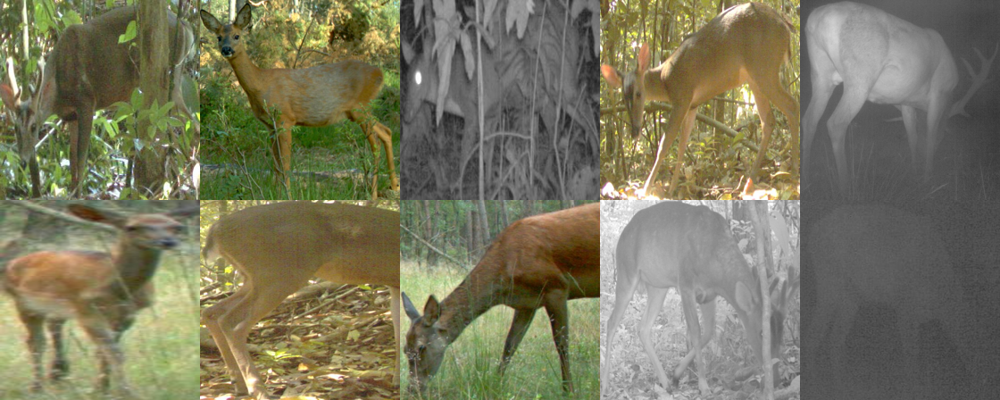

In [2]:
cropped_dir = '/kaggle/working/cropped_images'
grid_rows, grid_cols = 2, 5
image_size = (224, 224)  
all_images = [
    os.path.join(cropped_dir, f)
    for f in os.listdir(cropped_dir)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
]
random.shuffle(all_images)
selected = all_images[:grid_rows * grid_cols]
grid_img = Image.new('RGB', (image_size[0]*grid_cols, image_size[1]*grid_rows))

for idx, img_path in enumerate(selected):
    img = Image.open(img_path).resize(image_size)
    row, col = divmod(idx, grid_cols)
    grid_img.paste(img, (col * image_size[0], row * image_size[1]))

display(grid_img)

# Preprocessing Images for Classification 

In [48]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.applications.resnet50 import preprocess_input

image_size = (224, 224)
cropped_images = []
labels = []

for img_path, image_data in detections_data.items():
    for i, detection in enumerate(image_data["detections"]):
        crop_filename = f"{os.path.basename(img_path).split('.')[0]}_{i}.jpg"
        crop_path = os.path.join(output_crops_dir, crop_filename)
        img = load_img(crop_path, target_size=image_size)
        img_array = img_to_array(img)  
        img_array = np.expand_dims(img_array, axis=0)  
        img_array = preprocess_input(img_array)  
        
        cropped_images.append(img_array)
        species_label = image_data["class_label"]
        labels.append(species_label)

X = np.vstack(cropped_images)
y = np.array(labels)
clean_y = np.array([s.split('-', 1)[1] for s in y])
classes = np.unique(clean_y)
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
y_numeric = np.array([class_to_idx[label] for label in clean_y])
print("Mapping:", class_to_idx)
print(f"Prepared {len(X)} images for classification.")

Mapping: {'Red_Brocket_Deer': 0, 'Red_Deer': 1, 'Roe_Deer': 2, 'White_Tailed_Deer': 3}
Prepared 8865 images for classification.


# CLIP Environment Setup

In [49]:
!pip install ftfy regex tqdm
!pip install git+https://github.com/openai/CLIP.git
!pip install torch torchvision

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-h8l18x85
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-h8l18x85
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


# Importing Libraries

In [50]:
import torch
import clip
from PIL import Image
import os
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
import torch.nn as nn
import torch.optim as optim

# Fine-tuning CLIP on our Dataset

In [51]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from torchvision import transforms

MEAN_BGR = np.array([103.939, 116.779, 123.68], dtype=np.float32)

def undo_resnet_preprocess(x):
    bgr = x.copy()
    bgr[..., 0] += MEAN_BGR[0]
    bgr[..., 1] += MEAN_BGR[1]
    bgr[..., 2] += MEAN_BGR[2]
    rgb = bgr[..., ::-1]
    rgb = np.clip(rgb, 0, 255).astype(np.uint8)
    return rgb

class CLIPArrayDataset(Dataset):
    def __init__(self, X, y, preprocess, train=False):
        self.X = X
        self.y = y
        self.preprocess = preprocess
        self.train = train
        self.augment = transforms.Compose([
            transforms.RandomHorizontalFlip(p=0.5),
        ]) if train else None

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        arr = undo_resnet_preprocess(self.X[idx])
        img = Image.fromarray(arr)
        if self.train and self.augment:
            img = self.augment(img)
        img = self.preprocess(img)
        label = int(self.y[idx])
        return img, label

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model = model.float()  
model.eval()

class CLIPFineTune(nn.Module):
    def __init__(self, clip_model, num_classes):
        super(CLIPFineTune, self).__init__()
        self.clip_model = clip_model.visual  
        self.classifier = nn.Sequential(
            nn.Linear(512, 256),  
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(256, num_classes),
        )

    def forward(self, x):
        features = self.clip_model(x) 
        logits = self.classifier(features)
        return features, logits

X_train, X_test, y_train, y_test = train_test_split(
    X, y_numeric, test_size=0.2, stratify=y_numeric, random_state=42
)

train_ds = CLIPArrayDataset(X_train, y_train, preprocess, train=True)
test_ds = CLIPArrayDataset(X_test, y_test, preprocess, train=False)

train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=0)
test_loader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=0)

print("\n Fine-Tuning CLIP…")
num_classes = len(np.unique(y_train))
clip_finetune = CLIPFineTune(model, num_classes).to(device)
optimizer = optim.Adam(clip_finetune.parameters(), lr=1e-5, weight_decay=1e-4)
criterion = nn.CrossEntropyLoss()

num_epochs = 5
clip_finetune.train()
for epoch in range(num_epochs):
    total_loss = 0
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        _, logits = clip_finetune(imgs)
        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss/len(train_loader):.4f}")

def extract_finetuned_features(loader, model):
    model.eval()
    feats, labs = [], []
    with torch.no_grad():
        for imgs, labels in loader:
            imgs = imgs.to(device)
            features, _ = model(imgs)
            feats.append(features.cpu().numpy())
            labs.append(labels.numpy())
    return np.vstack(feats), np.concatenate(labs)

print("Extracting fine-tuned train features…")
X_train_feats, y_train_feats = extract_finetuned_features(train_loader, clip_finetune)

print("Extracting fine-tuned test features…")
X_test_feats, y_test_feats = extract_finetuned_features(test_loader, clip_finetune)


 Fine-Tuning CLIP…
Epoch 1/5, Loss: 0.6561
Epoch 2/5, Loss: 0.3369
Epoch 3/5, Loss: 0.2013
Epoch 4/5, Loss: 0.1505
Epoch 5/5, Loss: 0.1123
Extracting fine-tuned train features…
Extracting fine-tuned test features…


# Training and Testing Classifier


In [52]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_feats)
X_test_scaled = scaler.transform(X_test_feats)

print("\n Training Stacking Classifier (MLP + XGBoost)…")
mlp = MLPClassifier(
    hidden_layer_sizes=(512, 256),
    max_iter=1000,
    alpha=0.01,  
    learning_rate_init=0.001,
    solver='adam',
    random_state=42,
    early_stopping=True,
    validation_fraction=0.2,
    n_iter_no_change=20,
)

xgb_model = xgb.XGBClassifier(
    n_estimators=150,
    max_depth=4,
    learning_rate=0.05,
    random_state=42,
    eval_metric='logloss',
)

meta_learner = LogisticRegression(random_state=42)

stacking = StackingClassifier(
    estimators=[
        ('mlp', mlp),
        ('xgb', xgb_model),
    ],
    final_estimator=meta_learner,
    cv=5,
)

stacking.fit(X_train_scaled, y_train_feats)

stacking_train_acc = accuracy_score(y_train_feats, stacking.predict(X_train_scaled)) * 100
stacking_test_acc = accuracy_score(y_test_feats, stacking.predict(X_test_scaled)) * 100

print(f"Stacking Train Accuracy: {stacking_train_acc:.2f}%")
print(f"Stacking Test Accuracy: {stacking_test_acc:.2f}%")


 Training Stacking Classifier (MLP + XGBoost)…
Stacking Train Accuracy: 99.77%
Stacking Test Accuracy: 95.71%


# Visualization of Results

## Classification Report

=== Classification Report (Test Set) ===
              precision    recall  f1-score   support

           0       0.88      0.85      0.86       183
           1       0.98      0.99      0.99       953
           2       0.95      0.93      0.94       234
           3       0.93      0.95      0.94       403

    accuracy                           0.96      1773
   macro avg       0.94      0.93      0.93      1773
weighted avg       0.96      0.96      0.96      1773



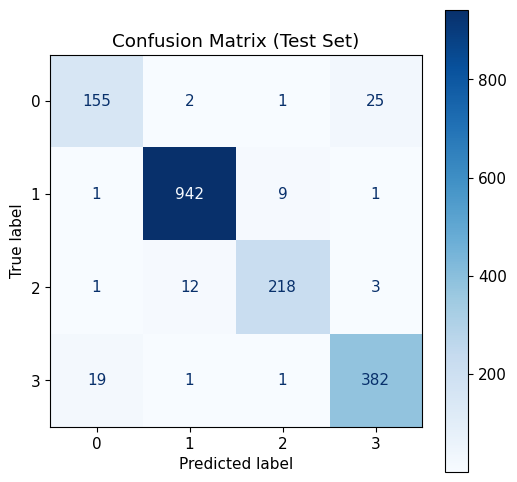

In [53]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display

stacking_results = {
    "train_accuracy": stacking_train_acc,
    "test_accuracy": stacking_test_acc,
    "y_train_true": y_train_feats,
    "y_train_pred": stacking.predict(X_train_scaled),
    "y_test_true": y_test_feats,
    "y_test_pred": stacking.predict(X_test_scaled),
}

print("=== Classification Report (Test Set) ===")
print(classification_report(stacking_results["y_test_true"], stacking_results["y_test_pred"]))

cm = confusion_matrix(stacking_results["y_test_true"], stacking_results["y_test_pred"])
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
fig_cm, ax_cm = plt.subplots(figsize=(6, 6))
disp.plot(cmap=plt.cm.Blues, ax=ax_cm)
ax_cm.set_title("Confusion Matrix (Test Set)")
display(fig_cm)

## Discussion

The model demonstrates strong performance on the test set, achieving an impressive overall accuracy of 96%. The classification report shows that Classes 1, 2, and 3 are predicted with high precision and recall, especially Class 1, which stands out with nearly perfect scores (precision 0.98, recall 0.99). Class 2 and Class 3 also show balanced and reliable predictions with F1-scores of 0.94 each. However, Class 0 lags slightly behind with a lower recall of 0.85, indicating that some true samples of Class 0 are being misclassified, most often as Class 3, as seen in the confusion matrix. Despite this, the model maintains a high weighted average F1-score of 0.96, reflecting consistent and dependable predictions across classes, especially given the imbalance in class distribution. Overall, the model is performing well, though some further attention to Class 0 could help close the gap in its predictive performance.

## ROC and P-R curves

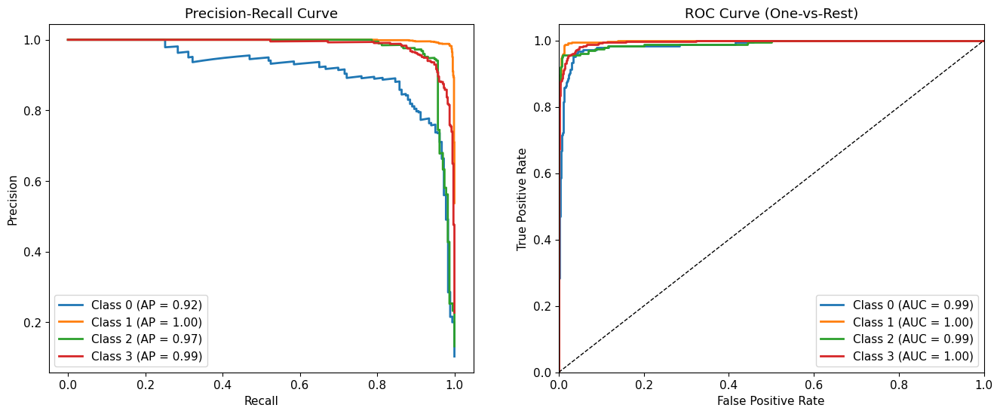

In [54]:
from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from IPython.display import display

classes = np.unique(stacking_results["y_test_true"])
y_test_bin = label_binarize(stacking_results["y_test_true"], classes=classes)
y_score = stacking.predict_proba(X_test_scaled)
fig, (ax_pr, ax_roc) = plt.subplots(1, 2, figsize=(16, 6))
for i, class_label in enumerate(classes):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_score[:, i])
    ap = average_precision_score(y_test_bin[:, i], y_score[:, i])
    ax_pr.plot(recall, precision, lw=2, label=f'Class {class_label} (AP = {ap:.2f})')

ax_pr.set_xlabel('Recall')
ax_pr.set_ylabel('Precision')
ax_pr.set_title('Precision-Recall Curve')
ax_pr.legend(loc='lower left')

for i, class_label in enumerate(classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    ax_roc.plot(fpr, tpr, lw=2, label=f'Class {class_label} (AUC = {roc_auc:.2f})')

ax_roc.plot([0, 1], [0, 1], 'k--', lw=1)
ax_roc.set_xlim([0.0, 1.0])
ax_roc.set_ylim([0.0, 1.05])
ax_roc.set_xlabel('False Positive Rate')
ax_roc.set_ylabel('True Positive Rate')
ax_roc.set_title('ROC Curve (One-vs-Rest)')
ax_roc.legend(loc="lower right")

display(fig)


## Disscussion

The Precision-Recall and ROC curves highlight the excellent performance of the model across all classes. Classes 1 and 3 show near-perfect results with both AP and AUC values of 1.00, while Class 2 also performs very well with AP 0.97 and AUC 0.99. Class 0, although slightly lower with an AP of 0.92, still maintains a strong AUC of 0.99, indicating reliable predictions. Overall, the model shows great class separation and high confidence, with only slight improvement needed for Class 0.

## Comparison with Base Model

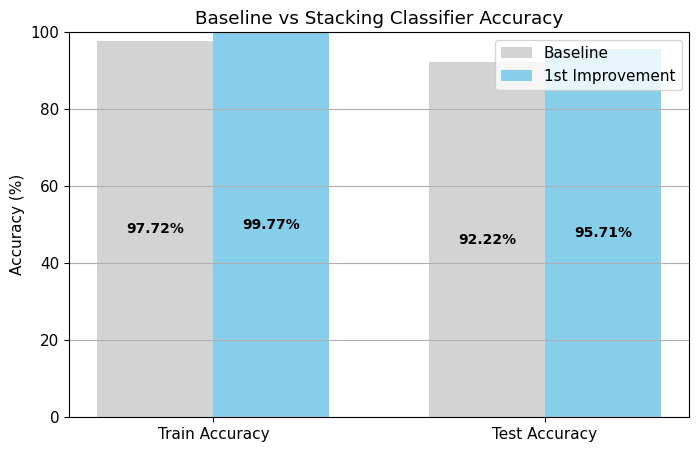

In [55]:
import matplotlib.pyplot as plt
from IPython.display import display

bl_train_acc = 97.72
bl_test_acc = 92.22
stack_train_acc = stacking_results["train_accuracy"]
stack_test_acc = stacking_results["test_accuracy"]
labels = ["Train Accuracy", "Test Accuracy"]
baseline = [bl_train_acc, bl_test_acc]
stacking = [stack_train_acc, stack_test_acc]
x = range(len(labels))
fig_combined, ax = plt.subplots(figsize=(8, 5))
bar_width = 0.35

bars1 = ax.bar([i - bar_width / 2 for i in x], baseline, width=bar_width, label="Baseline", color="lightgray")
bars2 = ax.bar([i + bar_width / 2 for i in x], stacking, width=bar_width, label="1st Improvement", color="skyblue")
for bars, values in zip([bars1, bars2], [baseline, stacking]):
    for bar, val in zip(bars, values):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            val / 2,
            f"{val:.2f}%",
            ha='center',
            va='center',
            fontsize=10,
            fontweight='bold'
        )

ax.set_ylim(0, 100)
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.set_ylabel("Accuracy (%)")
ax.set_title("Baseline vs Stacking Classifier Accuracy")
ax.legend()
ax.grid(axis='y')

display(fig_combined)

# Analysis and Insights

## Pipeline Architecture Summary

* Raw Missouri Deer Dataset

* Flattening and organizing the directories.

* Detection of animals using MegaDetector V6.

* Cropping the detected bounding boxes.

* Extracting features using CLIP.

* Training MLP and XGBoost classifiers.

* Applying a stacking ensemble of models.

* Evaluating predictions using various metrics and visualizations.

## Methodology

The pipeline for wildlife species detection and classification, focused on various deer species from the Missouri dataset, is divided into two major stages: Detection and Classification.

Detection with MegaDetector V6 (YOLOv9-c variant)

The detection phase uses the MegaDetectorV6 model pretrained on wildlife datasets. This model’s primary function is to detect animals in camera trap images and generate bounding boxes around them. The MegaDetector is chosen because it has high accuracy in detecting a wide range of animals. The output of is a JSON-style dictionary containing the bounding boxes and confidence scores, allowing the relevant animal regions to be isolated. This step reduces background noise and improves classifier performance by feeding the model only the detected regions of interest.

Classification Phase

Feature Extraction using CLIP
In the classification phase, the CLIP model is employed to extract semantic features from the cropped animal images. The encoder of the CLIP model is frozen, and only the classifier head is fine-tuned. The advantage of using CLIP lies in its training on large-scale vision-language datasets, which enables it to generalize well to new domains with limited data. This makes CLIP ideal for the classification task, even with a relatively small and imbalanced dataset.

Custom Classifier Head

To improve classification performance, a custom MLP classifier head is added on top of the CLIP embeddings. The MLP head features a deeper architecture and is trained with class weights to address the imbalance in the dataset. The activation function used is ReLU, and the output layer uses softmax to produce predictions over the different deer species. This setup enhances the model's ability to classify species accurately.

Ensembling

A stacking ensemble method is employed to further improve performance. The base models used in the ensemble are an MLP classifier trained on the CLIP features and an XGBoost classifier, which uses gradient-boosted trees to leverage the same feature vectors. A meta-learner, implemented as logistic regression, is applied on top of the base model predictions. This ensemble approach combines the strengths of linear and non-linear models, offering robustness and better generalization, particularly on the small dataset.

## Overall Insights & Benefits
he use of pretrained models like CLIP and MegaDetector allows leveraging large-scale learning without requiring extensive training on the specific dataset, making the process more efficient. By detecting animals before classification, we improve the signal-to-noise ratio, enhancing the model's accuracy by focusing on relevant regions of the image. The implementation of a stacking ensemble method boosts generalization, especially in cases of small datasets, by combining multiple models to capture a wider range of patterns. To address the common issue of class imbalance in wildlife datasets, weighted sampling ensures that the model is not biased towards the majority class, allowing it to better learn the minority classes.

## Future improvements

Although the model has demonstrated strong performance, there are several areas for future improvement. Increasing the number of samples for Class 0 or applying targeted data augmentation could help address its slightly lower recall and precision. Fine-tuning more layers of the model may also improve generalization across all classes. Additionally, experimenting with advanced optimization techniques, learning rate schedulers, and ensemble models could further enhance accuracy. Additional extensive testing on new datasets to verify its generalizability over unseen and diverse data.